In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as T
from torchvision.datasets import CocoDetection
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models import ResNet50_Weights
from fvcore.nn import FlopCountAnalysis, parameter_count_table
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import matplotlib.pyplot as plt

In [ ]:
class CocoDataset(CocoDetection):
  def __init__(self, *args, **kwargs):
    super().__init__(*args, **kwargs)
    
    self.transform = T.Compose([
      T.ColorJitter(0.2, 0.2, 0.2, 0.2), T.RandomGrayscale(0.1),
      T.ToTensor(), 
      T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
      ])
  
  def __getitem__(self, idx):
    img, anns = super().__getitem__(idx)
    img = self.transform(img)
    boxes = []
    labels = []
    for ann in anns:
      bbox = [ann["bbox"][0], ann["bbox"][1], ann["bbox"][0] + ann["bbox"][2], ann["bbox"][1] + ann["bbox"][3]] 
      boxes.append(bbox)
      labels.append(ann["category_id"])
    
    boxes = torch.tensor(boxes, dtype=torch.float32)
    labels = torch.tensor(labels, dtype=torch.int64)
    target = {"boxes": boxes, "labels": labels}
    return img, target

In [3]:
train_dataset = CocoDataset(
  root    = "./SkyFusion.v1i.coco/train",
  annFile = "./SkyFusion.v1i.coco/train/_annotations.coco.json",
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

test_dataset = CocoDataset(
  root    = "./SkyFusion.v1i.coco/test",
  annFile = "./SkyFusion.v1i.coco/test/_annotations.coco.json",
)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

val_dataset = CocoDataset(
  root    = "./SkyFusion.v1i.coco/valid",
  annFile = "./SkyFusion.v1i.coco/valid/_annotations.coco.json",
)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.20s)
creating index...
index created!
loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


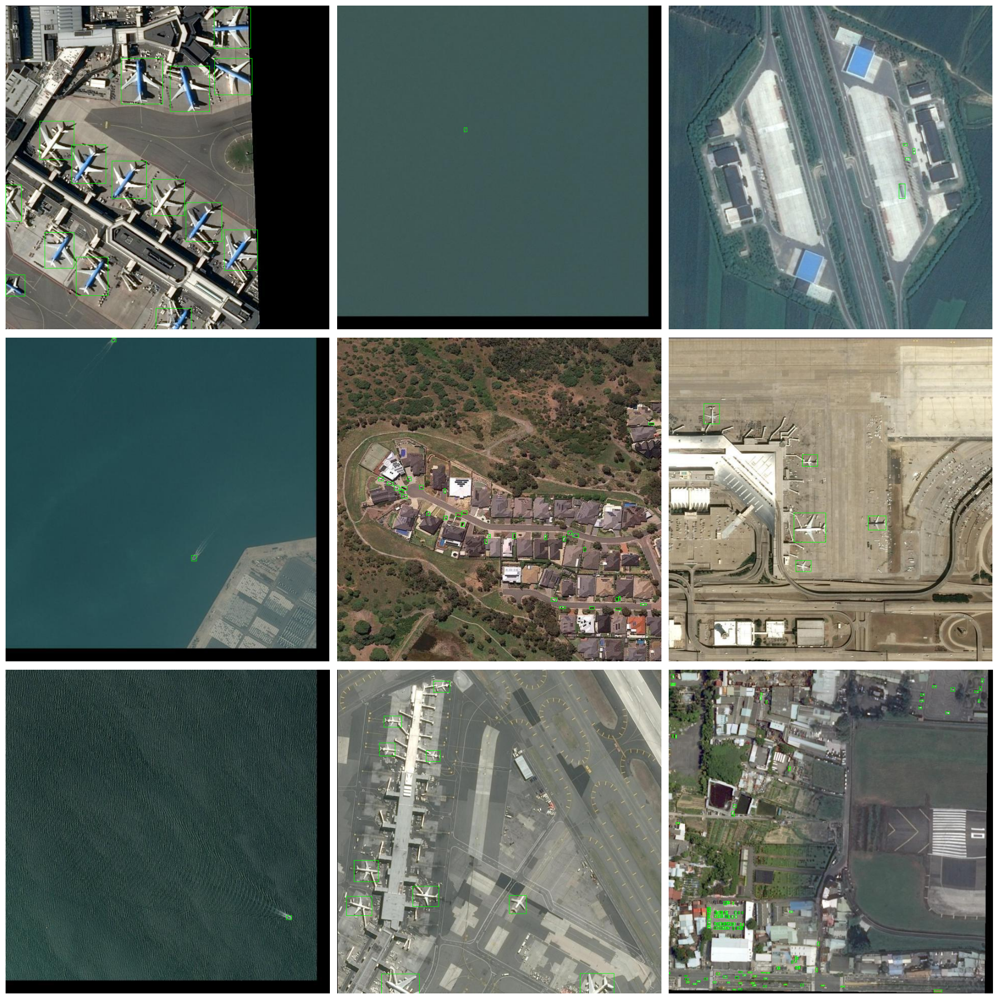

In [4]:
import cv2

imgs, tgts = [], []
for batch_imgs, batch_tgts in train_loader:
  for img, tgt in zip(batch_imgs, batch_tgts):
    imgs.append(img)
    tgts.append(tgt)
    if len(imgs) == 9:
      break
  if len(imgs) == 9:
    break

fig, axes = plt.subplots(3, 3, figsize=(18, 18))

for ax, img_t, tgt in zip(axes.flatten(), imgs, tgts):
  img_np = (img_t.mul(255).permute(1, 2, 0).byte().cpu().numpy())
  img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

  for box in tgt["boxes"].cpu().numpy().astype(int):
    x1, y1, x2, y2 = box
    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color=(0, 255, 0), thickness=1)

  img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
  ax.imshow(img_rgb)
  ax.axis("off")

plt.tight_layout()
plt.show()

In [5]:
# # grab one batch
# images, targets = next(iter(train_loader))

# # images is a tuple/list of Tensors
# print("images  →", type(images),      "with", len(images), "elements")
# print("  └ image[0]:", images[0].shape, images[0].dtype)

# # targets is a tuple/list of dicts
# print("targets →", type(targets),     "with", len(targets), "elements")
# print("  └ target[0] keys:", targets[4].keys())
# print("     • boxes :", targets[4]['boxes'].shape, targets[4]['boxes'].dtype)
# print("     • labels:", targets[4]['labels'].shape, targets[4]['labels'].dtype)

In [5]:
num_classes = 4
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model = fasterrcnn_mobilenet_v3_large_fpn(num_classes=num_classes).to(device)

cuda


In [7]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

x = torch.randn(1, 3, 600, 600).to(next(model.parameters()).device)

# Run analysis
model.eval()
flops = FlopCountAnalysis(model, x)

print(parameter_count_table(model))
print(f"FLOPs: {flops.total()/1e9:.2f} GFLOPs")

params = count_parameters(model)
print(f"Total trainable parameters: {params:,}")

model.train()

| name                                 | #elements or shape   |
|:-------------------------------------|:---------------------|
| model                                | 18.9M                |
|  backbone                            |  4.4M                |
|   backbone.body                      |   2.9M               |
|    backbone.body.0                   |    0.4K              |
|    backbone.body.1                   |    0.4K              |
|    backbone.body.2                   |    3.1K              |
|    backbone.body.3                   |    4.1K              |
|    backbone.body.4                   |    10.0K             |
|    backbone.body.5                   |    20.4K             |
|    backbone.body.6                   |    20.4K             |
|    backbone.body.7                   |    31.0K             |
|    backbone.body.8                   |    33.8K             |
|    backbone.body.9                   |    31.1K             |
|    backbone.body.10                  |

c:\Users\Eugene\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\functional.py:4624: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  * torch.tensor(scale_factors[i], dtype=torch.float32)
c:\Users\Eugene\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\ops\boxes.py:167: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  boxes_x = torch.min(boxes_x, torch.tensor(width, dtype=boxes.dtype, device=boxes.device))
c:\Users\Eugene\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\ops\boxes.py:169: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(

FLOPs: 18.42 GFLOPs
Total trainable parameters: 18,881,583


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

1e-08


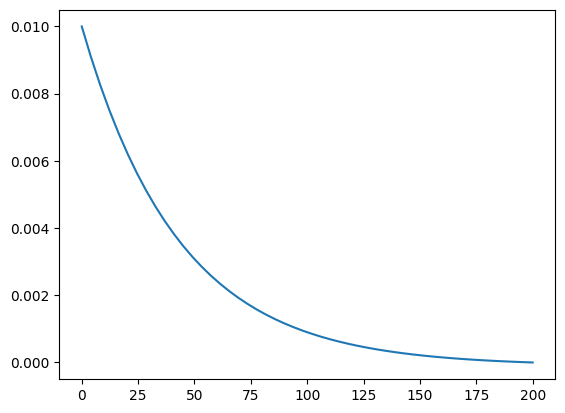

In [8]:
import numpy as np

def lr_shedule(epoch_index, max_epochs, from_lr, to_lr):
  a = 0.99
  return (from_lr - to_lr) * ((1-a) ** ((epoch_index) / (max_epochs - 1)) - (1-a)) / a + to_lr

x = np.linspace(0, 200)

plt.figure()
plt.plot(x, lr_shedule(x, 200, 1e-2, 1e-8))

print(lr_shedule(199, 200, 1e-2, 1e-8))

In [9]:
# model.load_state_dict(torch.load("faster_cnn_best.pt", weights_only=True))

In [ ]:
import math

map_metric = MeanAveragePrecision(iou_type="bbox")

params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.AdamW(params, lr=0.005, weight_decay=0.0005)
num_epochs = 50
from_lr = 1e-3
to_lr=1e-7

best_epoch = 1
best_val_loss = math.inf
best_mAP50 = 0
best_mAP50_95 = 0
history = []
for epoch in range(num_epochs):
  # if (best_epoch + 8 <= epoch):
  #   print("Early stopped")
  #   break
  
  model.train()
  train_loss = 0.0
  
  optimizer.param_groups[0]['lr'] = lr_shedule(epoch, num_epochs, from_lr, to_lr)
  
  for images, targets in train_loader:
    images = [img.to(device) for img in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    optimizer.zero_grad()
    loss_dict = model(images, targets)
    losses = (
      loss_dict["loss_classifier"] * 1.0 +
      loss_dict["loss_box_reg"] * 2.0 +
      loss_dict["loss_objectness"] * 1.0 +
      loss_dict["loss_rpn_box_reg"] * 2.0
    )
    losses.backward()
    optimizer.step()

    train_loss += losses.item()
    
  train_loss /= len(train_loader)

  val_loss = 0.0
  map_metric.reset()
  with torch.no_grad():
    for images, targets in val_loader:
      images = [img.to(device) for img in images]
      targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
      
      loss_dict = model(images, targets)
      losses = (
        loss_dict["loss_classifier"] * 1.0 +
        loss_dict["loss_box_reg"] * 2.0 +
        loss_dict["loss_objectness"] * 1.0 +
        loss_dict["loss_rpn_box_reg"] * 2.0
      )
      
      val_loss += losses.item()
      
      model.eval()
      preds = model(images)
      model.train()
      
      map_metric.update(preds, targets)
    
    val_loss /= len(val_loader)
    
  stats = map_metric.compute()
  mAP50 = stats["map_50"].item()
  mAP50_95 = stats["map"].item()
    
  if (val_loss < best_val_loss):
    torch.save(model.state_dict(), "faster_cnn_best.pt")
    best_val_loss = val_loss
    best_epoch = epoch + 1
    best_mAP50 = mAP50
    best_mAP50_95 = mAP50_95
    
  history.append({"epoch": epoch + 1, "train_loss": train_loss, "val_loss": val_loss, "mAP50": mAP50, "mAP50-95": mAP50_95})

  print(
    f"Epoch {epoch+1:02d} | "
    f"Train Loss: {train_loss:.4f} | "
    f"Val Loss:   {val_loss:.4f} | "
    f"mAP50:   {mAP50:.4f} | "
    f"mAP50-95:   {mAP50_95:.4f} | "
  )
  
print(f"Best epoch {best_epoch} with val_loss={best_val_loss}, mAP50={best_mAP50}, mAP50_95={best_mAP50_95}")

Epoch 01 | Train Loss: 0.8404 | Val Loss:   0.6920 | mAP50:   0.0424 | mAP50-95:   0.0117 | 
Epoch 02 | Train Loss: 0.7701 | Val Loss:   0.7353 | mAP50:   0.1393 | mAP50-95:   0.0471 | 
Epoch 03 | Train Loss: 0.7615 | Val Loss:   0.7478 | mAP50:   0.2023 | mAP50-95:   0.0764 | 
Epoch 04 | Train Loss: 0.7256 | Val Loss:   0.7816 | mAP50:   0.2485 | mAP50-95:   0.1142 | 
Epoch 05 | Train Loss: 0.7003 | Val Loss:   0.7327 | mAP50:   0.2656 | mAP50-95:   0.1361 | 
Epoch 06 | Train Loss: 0.6739 | Val Loss:   0.6791 | mAP50:   0.2694 | mAP50-95:   0.1377 | 
Epoch 07 | Train Loss: 0.6666 | Val Loss:   0.7241 | mAP50:   0.2837 | mAP50-95:   0.1490 | 
Epoch 08 | Train Loss: 0.6547 | Val Loss:   0.6299 | mAP50:   0.2937 | mAP50-95:   0.1532 | 
Epoch 09 | Train Loss: 0.6419 | Val Loss:   0.6972 | mAP50:   0.2901 | mAP50-95:   0.1478 | 
Epoch 10 | Train Loss: 0.6356 | Val Loss:   0.7776 | mAP50:   0.2987 | mAP50-95:   0.1605 | 
Epoch 11 | Train Loss: 0.6345 | Val Loss:   0.6602 | mAP50:   0.2939 |

In [13]:
torch.save(model.state_dict(), "faster_cnn_last.pt")

In [7]:
model.load_state_dict(torch.load("faster_cnn_last.pt", weights_only=True))
model.eval()
map_metric = MeanAveragePrecision(iou_type="bbox")
map_metric.reset()

with torch.no_grad():
  for images, targets in test_loader:
    images = [img.to(device) for img in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    preds = model(images)
    map_metric.update(preds, targets)

stats = map_metric.compute()
mAP50 = stats["map_50"].item()
mAP50_95 = stats["map"].item()

print(f"mAP50: {mAP50}  mAP50-95: {mAP50_95}")

mAP50: 0.10565756261348724  mAP50-95: 0.0318150594830513


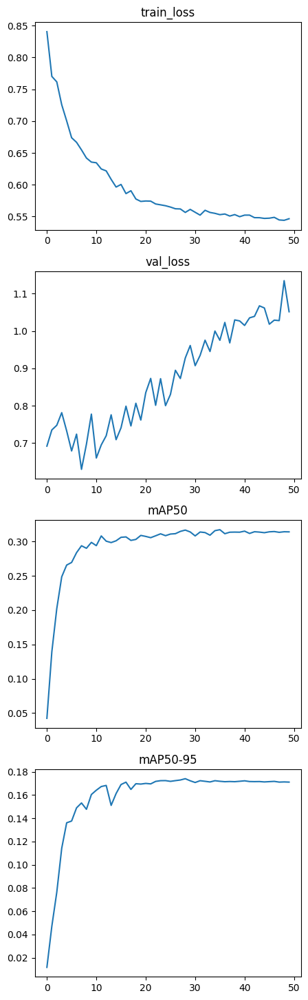

In [ ]:
fig, axes = plt.subplots(4, figsize=(5, 18))

keys = ["train_loss", "val_loss", "mAP50", "mAP50-95"]

x = range(num_epochs)

for ax, key in zip(axes.flatten(), keys):
  ax.plot(np.array(x), list(map(lambda item: item[key], history)))
  ax.set_title(key)

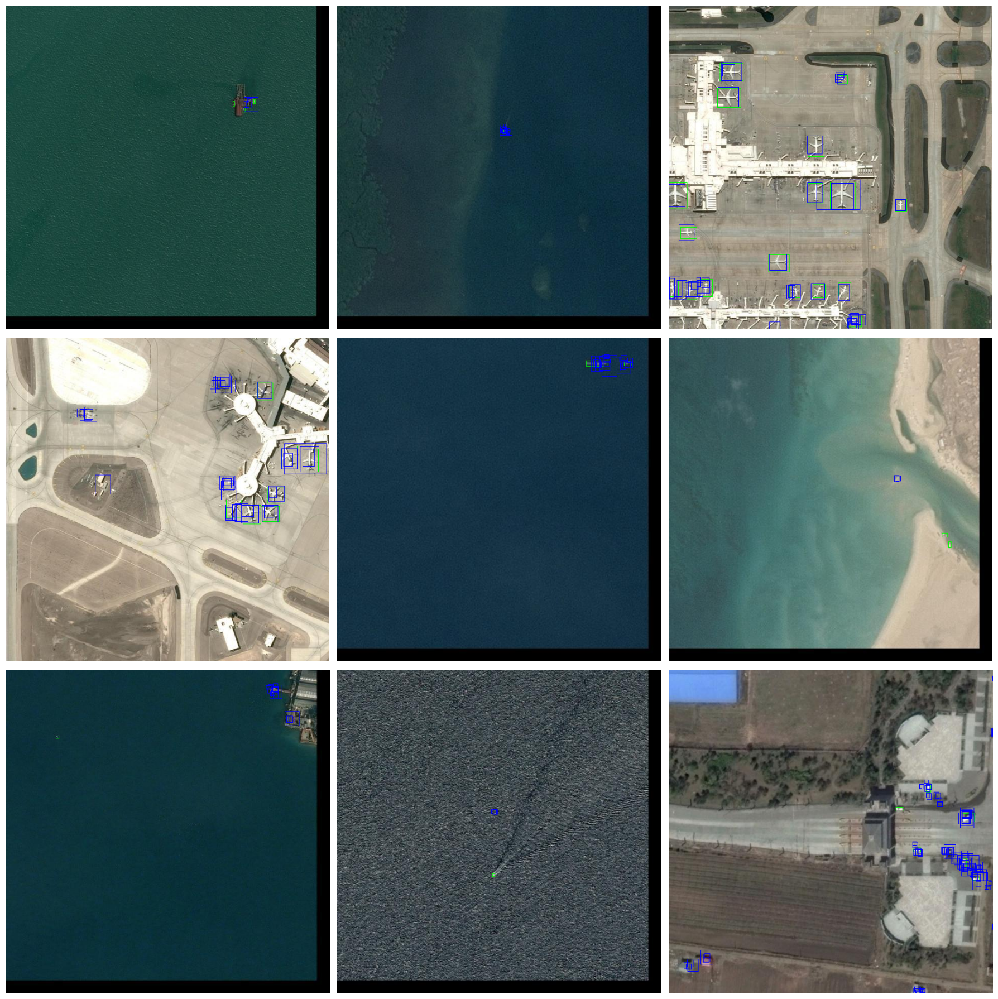

In [34]:
import cv2

imgs, tgts = [], []
for batch_imgs, batch_tgts in test_loader:
  for img, tgt in zip(batch_imgs, batch_tgts):
    imgs.append(img)
    tgts.append(tgt)
    if len(imgs) == 9:
      break
  if len(imgs) == 9:
    break
  
normalizer = T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
imgs_normalized = [normalizer(img).to(device) for img in imgs]
preds = model(imgs_normalized)
  
fig, axes = plt.subplots(3, 3, figsize=(18, 18))

for ax, img_t, tgt, pred in zip(axes.flatten(), imgs, tgts, preds):
  # x = T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
  # img_t = x(img_t)
  
  # print(img_t.shape)
  
  
  
  img_np = (img_t.mul(255).permute(1, 2, 0).byte().cpu().numpy())
  img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

  for box in tgt["boxes"].cpu().numpy().astype(int):
    x1, y1, x2, y2 = box
    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color=(0, 255, 0), thickness=1)
  
  for box in pred["boxes"].cpu().detach().numpy().astype(int):
    x1, y1, x2, y2 = box
    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=1)

  img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
  ax.imshow(img_rgb)
  ax.axis("off")
  

plt.tight_layout()
plt.show()

In [45]:
from time import time

imgs_count = sum([len(batch[0]) for batch in test_loader])

start_time = time()
for imgs_batch, targets_batch in test_loader:
  batch_normalized = [normalizer(img).to(device) for img in imgs]
  preds = model(batch_normalized)
  
end_time = time()

elapsed_seconds = end_time - start_time
fps = float(imgs_count) / elapsed_seconds
print(f"FPS: {fps}")

FPS: 112.79833930474618
